### Gabriel Ábrahám
### Ákos Lévárdy
### Percentage of work: 50%/50%
### Dataset: 81

In [1]:
import numpy as np
import pandas as pd
import matplotlib as plt
import seaborn as sns
import scipy
import scipy.stats as stats

## Analysis of data structure
### Importing the dataset.. Reading the .csv files

- We have 3 .csv files which are seperated with tabulators.
- The files provide information about users, their shopping sessions and about the shop they've visited.



In [2]:
productData = pd.read_csv("dataset/product.csv",sep="\t")

In [3]:
print(f"Number of records: {productData.shape[0]}\nNumber of attributes: {productData.shape[1]}")

Number of records: 14975
Number of attributes: 4


In [4]:
productData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14975 entries, 0 to 14974
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   location     14975 non-null  object
 1   product_ean  14975 non-null  int64 
 2   code         14960 non-null  object
 3   store_name   14975 non-null  object
dtypes: int64(1), object(3)
memory usage: 468.1+ KB


In [5]:
userData = pd.read_csv("dataset/user.csv",sep="\t")

In [6]:
print(f"Number of records: {userData.shape[0]}\nNumber of attributes: {userData.shape[1]}")

Number of records: 2525
Number of attributes: 11


In [7]:
userData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2525 entries, 0 to 2524
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   sex               1263 non-null   object
 1   residence         884 non-null    object
 2   username          2525 non-null   object
 3   user_id           2525 non-null   int64 
 4   address           2146 non-null   object
 5   current_location  2399 non-null   object
 6   registration      2525 non-null   object
 7   race              757 non-null    object
 8   name              2525 non-null   object
 9   birthdate         1389 non-null   object
 10  mail              2525 non-null   object
dtypes: int64(1), object(10)
memory usage: 217.1+ KB


In [81]:
sessionData = pd.read_csv("dataset/session.csv",sep="\t")

In [82]:
print(f"Number of records: {sessionData.shape[0]}\nNumber of attributes: {sessionData.shape[1]}")

Number of records: 11107
Number of attributes: 25


 - In the info we see that sessionData has string object columns. That's a problem in the data so we need to convert it to something reasonable

In [83]:
sessionData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11107 entries, 0 to 11106
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   pct_click_product_info          11096 non-null  float64
 1   user_id                         11107 non-null  int64  
 2   screen_height                   11107 non-null  object 
 3   pct_scroll_move_duration        11096 non-null  float64
 4   scroll_move_total_rel_distance  11096 non-null  float64
 5   pct_click                       11096 non-null  float64
 6   pct_scrandom                    11095 non-null  float64
 7   pct_wild_mouse                  11096 non-null  float64
 8   session_id                      11107 non-null  int64  
 9   browser_name                    11107 non-null  object 
 10  pct_input                       11096 non-null  float64
 11  screen_width                    11107 non-null  object 
 12  mouse_move_total_rel_distance   

## User Data

- Unifying dates in registration column and setting it as the DataFrame index

In [83]:
userData["registration"] = userData["registration"].apply(lambda x: pd.to_datetime(x).strftime("%Y-%m-%d"))

In [108]:
userData = userData.sort_values(by="registration")
userData.set_index("registration", inplace=True)

In [110]:
userData.head(10)

,sex,residence,username,user_id,address,current_location,race,name,birthdate,mail
registration,,,,,,,,,,
2013-09-22,F,NaN,zmarek,1807,V Nížinách 6\r\n276 31 Sedlec-Prčice,"(Decimal('58.3427835'), Decimal('101.334050'))",unspecified,Irena Sedláčková,1931-09-14,dana76@chello.cz
2013-09-24,F,NaN,yamadaryohei,1074,京都府白井市太田ヶ谷34丁目2番5号,"(Decimal('-50.456706'), Decimal('-172.520074'))",unspecified,伊藤 結衣,1969-05-02,pkato@yahoo.com
2013-09-25,F,NaN,milenacerna,1294,Rokytnická 4\r\n169 35 Přelouč,"(Decimal('3.1728475'), Decimal('97.911387'))",unspecified,Denisa Vávrová,1914-09-09,nikola83@volny.cz
2013-09-26,M,NaN,ruzickatomas,1686,NaN,"(Decimal('48.0218595'), Decimal('-68.727505'))",unspecified,Patrik Malý,1962-01-31,jindrich05@email.cz
2013-09-30,F,長野県葛飾区中小来川24丁目8番6号 コート北上野572,taichi54,964,東京都横浜市金沢区松石21丁目18番7号,"(Decimal('-15.5416345'), Decimal('123.791853'))",unspecified,前田 真綾,NaN,sayuri12@hotmail.com
2013-10-09,NaN,福島県西多摩郡檜原村芝大門7丁目22番6号 丹勢シティ500,yasuhiro03,503,鹿児島県横浜市緑区吾妻橋38丁目9番18号 コーポ元浅草783,"(Decimal('27.9412735'), Decimal('-156.530493'))",unspecified,松本 康弘,NaN,cnakamura@gmail.com
2013-10-10,NaN,Stefan-Siering-Gasse 08\r\n72596 Düren,niemeiergretl,481,Patric-Heidrich-Straße 2/2\r\n82727 Gotha,"(Decimal('-36.4387955'), Decimal('56.052913'))",unspecified,Wieland Schleich,1971-07-11,matoroehrdanz@gmail.com
2013-10-11,F,NaN,yutakato,1694,高知県武蔵村山市虎ノ門虎ノ門ヒルズ森タワー9丁目19番14号 クレスト東三島446,"(Decimal('-30.6729475'), Decimal('150.053937'))",unspecified,松本 くみ子,1945-09-22,takahashirei@gmail.com
2013-10-13,NaN,NaN,richard74,1609,"44138 Denise Lane\r\nSnyderhaven, TX 40567","(Decimal('67.119782'), Decimal('85.245710'))",unspecified,Candice Mann,2008-07-31,judithtorres@gmail.com


- Checking if the email addresses have correct format

In [87]:
import re

# ([^\s]+)@  any character except a whitespace at least once for the username followed by @
# ([^\s]+)\. any character except a whitespace at least once for the domain name(until the dot) followed by a dot
# ([^\s]){2,3} any character except a whitespace 2-3 times to finish the domain name
check = [address for address in userData.mail if not re.match("^([^\s]+)@([^\s]+)\.([^\s]){2,3}$", address)]
# empty list means all the addresses are correct
check

[]

- Setting NaNs in race column to "unspecified" cause the column already contains those

In [88]:
uniques = list(userData.race.unique())
for i in uniques:
    if type(i) == float:
        uniques.remove(i)
        break
userData.race = ["unspecified" if race not in uniques else race for race in userData.race]

- Number of NaNs in each column
- A large part of the DataFrame consists of rows that contain at least one NaN so for now we wont drop them

In [89]:
for column in userData.columns:
    if (nans := userData[column].isna().sum()) > 0:
        print(f"{column}: {nans}")

sex: 1262
residence: 1641
address: 379
current_location: 126
birthdate: 1136


In [91]:
print(f"Number of duplicate records: {userData[userData.duplicated].shape[0]}")

Number of duplicate records: 0


## Product Data

productData has rows with NaN, we will delete them

In [331]:
productData.isna().sum()

location        0
product_ean     0
code           15
store_name      0
dtype: int64

In [75]:
productData = productData.dropna()

In [76]:
productData = productData.reset_index().drop("index",axis=1)

In [92]:
print(f"Number of duplicate records: {productData[productData.duplicated].shape[0]}")

Number of duplicate records: 0


## Session Data

- session_start should be a timestamp so we use to_datetime() to convert it

In [84]:
sessionData["session_start"] = pd.to_datetime(sessionData["session_start"])

- Replacing ack 1/0 values with True/False

In [85]:
a = [bool(val) for val in sessionData["ack"]]
sessionData["ack"] = a

- Replacing higher/lower in screen height/width columns with the max and min values of the columns (higher = max , lower = min)

In [86]:
heights = [int(i) for i in sessionData.screen_height.unique() if i not in ["lower", "higher"]]
replacer = {"lower":min(heights),"higher": max(heights)}

sessionData.screen_height = [int(i) if i not in ["lower", "higher"] else replacer.get(i) for i in sessionData["screen_height"] ]

In [87]:
widths = [int(i) for i in sessionData.screen_width.unique() if i not in ["lower", "higher"]]
replacer = {"lower":min(widths),"higher": max(widths)}

sessionData.screen_width = [int(i) if i not in ["lower", "higher"] else replacer.get(i) for i in sessionData["screen_width"]]

- Replacing browser names with numbers from 0 to 6

In [88]:
browsers = {k:v for k,v in zip(sessionData.browser_name.unique(), range(len(sessionData.browser_name.unique())))}
print(browsers)

{'firefox': 0, 'edge': 1, 'chrome': 2, 'mobile': 3, 'safari': 4, 'opera': 5, 'other': 6}


In [89]:
sessionData.browser_name = [browsers.get(browser) for browser in sessionData.browser_name]

- Sorting the data by date and set the date as the index

In [90]:
sessionDataByDate = sessionData.sort_values(by="session_start")

In [91]:
sessionDataByDate.set_index("session_start", inplace=True)

### Duplicate records in sessionData

In [92]:
print(f"Number of duplicate records: {sessionDataByDate[sessionDataByDate.duplicated].shape[0]}")

Number of duplicate records: 132


### NaNs

- We check how many NaNs there are, and then remove them

In [93]:
sessionDataByDate.isna().sum()

pct_click_product_info            11
user_id                            0
screen_height                      0
pct_scroll_move_duration          11
scroll_move_total_rel_distance    11
pct_click                         11
pct_scrandom                      12
pct_wild_mouse                    11
session_id                         0
browser_name                       0
pct_input                         11
screen_width                       0
mouse_move_total_rel_distance     11
pct_mouse_click                   11
wild_mouse_duration               11
pct_mouse_move                    11
pct_doubleclick                   12
pct_rage_click                    11
ack                                0
page_activity_duration            11
total_load_time                    0
pct_scroll_move                   11
product_ean                        0
session_duration                   0
dtype: int64

In [94]:
sessionDataByDate = sessionDataByDate.dropna()

### Outliers in sessionData

<Axes: xlabel='ack', ylabel='total_load_time'>

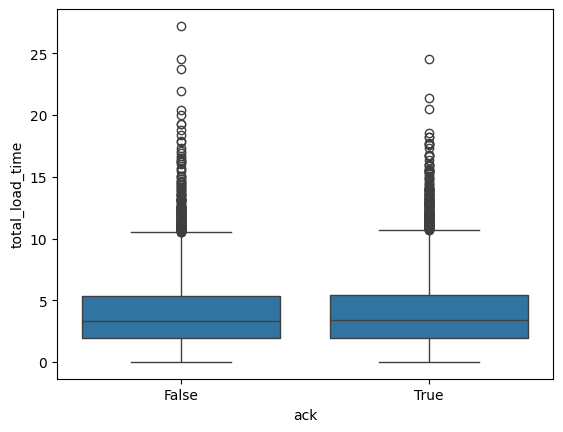

In [95]:
sns.boxplot(sessionDataByDate,x="ack", y="total_load_time")

In [249]:
def identify_outliers(a):
    lower = a.quantile(0.25) - 1.5 * stats.iqr(a)
    upper = a.quantile(0.75) + 1.5 * stats.iqr(a)
    
    return a[(a > upper) | (a < lower)]

out = identify_outliers(sessionDataByDate["total_load_time"])
out


session_start
2018-10-01 05:21:22    12.27116
2018-10-03 06:33:39    14.15039
2018-10-29 21:46:48    12.21505
2018-10-31 16:08:12    15.41455
2018-11-02 11:11:46    11.65693
                         ...   
2023-08-30 07:01:55    12.60234
2023-09-06 20:40:06    17.36514
2023-09-08 17:47:34    10.80338
2023-09-10 04:33:58    12.59038
2023-09-20 14:09:01    11.19539
Name: total_load_time, Length: 340, dtype: float64

### Other problems
- session_duration has values that are negative which doesn't make sense

In [97]:
print(f"Negatives in session duration: {sessionDataByDate[sessionDataByDate['session_duration'] < 0].shape[0]}")

Negatives in session duration: 67


In [98]:
sessionDataByDate = sessionDataByDate.dropna()

## Basic descriptive statistics and Shapiro-Wilk test for Normal(Gaussian) Distribution

- H₀ : The data is normally distributed.
- H₁ : The data is not normally distributed

In [99]:
def normalityTest(shapiro):
    if shapiro.pvalue > 0.05:
        print(f"{shapiro.pvalue} > 0.05 >> Fail to Reject H0; data is normally distributed")
    else:
        print(f"{shapiro.pvalue} < 0.05 >> Reject H0; data is not normally distributed")

for column in sessionData.columns:
    if column != "session_start":
        print(column)
        normalityTest(scipy.stats.shapiro(sessionDataByDate[column]))
        print()

pct_click_product_info
0.9492663741111755 > 0.05 >> Fail to Reject H0; data is normally distributed

user_id
0.0 < 0.05 >> Reject H0; data is not normally distributed

screen_height
0.0 < 0.05 >> Reject H0; data is not normally distributed

pct_scroll_move_duration
6.220141449536632e-16 < 0.05 >> Reject H0; data is not normally distributed

scroll_move_total_rel_distance
0.0 < 0.05 >> Reject H0; data is not normally distributed

pct_click
8.148934728654862e-24 < 0.05 >> Reject H0; data is not normally distributed

pct_scrandom
0.9727791547775269 > 0.05 >> Fail to Reject H0; data is normally distributed

pct_wild_mouse
0.2037685513496399 > 0.05 >> Fail to Reject H0; data is normally distributed

session_id
0.0 < 0.05 >> Reject H0; data is not normally distributed

browser_name
0.0 < 0.05 >> Reject H0; data is not normally distributed

pct_input
0.0 < 0.05 >> Reject H0; data is not normally distributed

screen_width
0.0 < 0.05 >> Reject H0; data is not normally distributed

mouse_move_to

C:\Users\pc-Gábor\Documents\FIIT\zadanie\env\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [100]:
sessionDataByDate.describe()

,pct_click_product_info,user_id,screen_height,pct_scroll_move_duration,scroll_move_total_rel_distance,pct_click,pct_scrandom,pct_wild_mouse,session_id,browser_name,...,pct_mouse_click,wild_mouse_duration,pct_mouse_move,pct_doubleclick,pct_rage_click,page_activity_duration,total_load_time,pct_scroll_move,product_ean,session_duration
count,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,1.094200e+04,10942.00000,...,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,10942.000000,1.094200e+04,10942.000000
mean,50.479582,1235.923323,850.674465,15.238988,13.724725,12.607945,48.904302,47.732117,7.439823e+05,2.12612,...,13.540727,13.582686,13.535034,14.306814,54.485691,14.486432,4.028072,44.107529,5.006844e+12,150.133110
std,13.600456,718.389334,187.191831,1.347556,2.076300,2.098802,12.073777,13.437575,4.311727e+05,1.54735,...,1.000892,3.078217,0.996281,1.931472,12.487762,1.940531,2.843414,13.198739,2.888848e+12,59.374521
min,0.000000,0.000000,600.000000,9.657490,6.669420,4.673820,0.000000,0.000000,1.078000e+03,0.00000,...,9.792600,0.000000,9.338530,6.271650,0.000000,7.377110,0.008030,0.000000,1.119810e+09,-63.972190
25%,41.289160,619.250000,768.000000,14.395800,12.075905,11.105995,40.815890,38.694052,3.731112e+05,1.00000,...,12.863453,11.830440,12.863130,13.273688,45.998193,13.235173,1.937228,35.122413,2.476588e+12,109.746228
50%,50.518765,1228.500000,800.000000,15.245940,14.278485,12.406150,48.841170,47.827710,7.407390e+05,2.00000,...,13.544760,13.458125,13.548480,14.774340,54.552655,14.782540,3.390015,44.086660,4.990399e+12,149.539340
75%,59.648595,1854.000000,1080.000000,16.051970,15.372645,14.038450,56.922305,56.725167,1.112570e+06,3.00000,...,14.227035,15.820880,14.205445,15.648523,62.916835,15.864820,5.431825,52.948738,7.529846e+12,190.308802
max,100.000000,2499.000000,1080.000000,21.056660,18.692900,20.471820,100.000000,100.000000,1.499938e+06,6.00000,...,17.351800,22.915790,17.529780,19.716730,99.634470,22.295860,27.211750,100.000000,9.999900e+12,372.845880


### Correlations between pairs of attributes

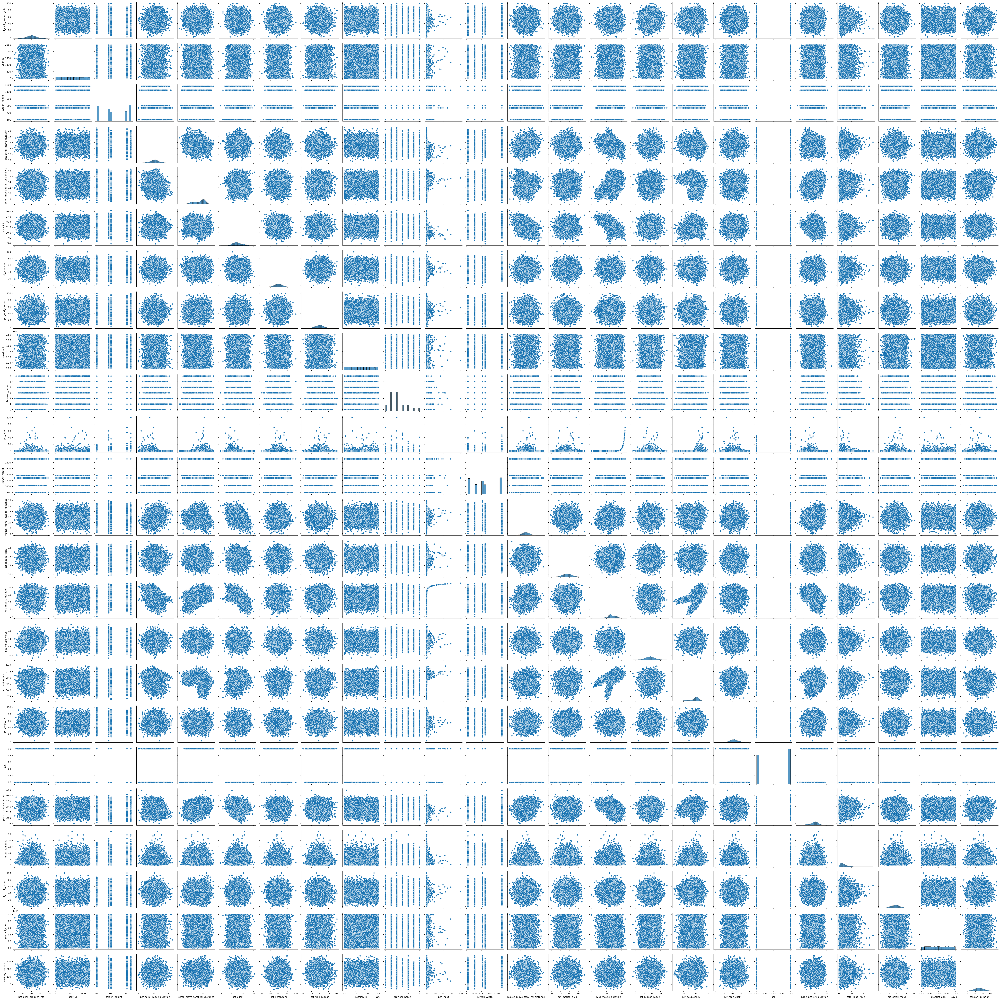

In [332]:
sns.pairplot(sessionDataByDate)

In [101]:
sessionDataByDate.corr()

,pct_click_product_info,user_id,screen_height,pct_scroll_move_duration,scroll_move_total_rel_distance,pct_click,pct_scrandom,pct_wild_mouse,session_id,browser_name,...,wild_mouse_duration,pct_mouse_move,pct_doubleclick,pct_rage_click,ack,page_activity_duration,total_load_time,pct_scroll_move,product_ean,session_duration
pct_click_product_info,1.000000,0.000113,0.005818,0.004880,0.001449,-0.004593,0.003911,0.005284,-0.007023,-0.005909,...,-0.015590,0.013663,-0.007182,0.009396,0.016199,0.023970,0.017195,-0.004576,-0.005853,0.007160
user_id,0.000113,1.000000,-0.016413,-0.008156,0.000723,0.014636,-0.003705,0.006242,-0.007738,-0.011196,...,0.003042,0.005419,0.008280,0.004696,-0.015251,-0.005916,0.003968,-0.010389,-0.004802,-0.006163
screen_height,0.005818,-0.016413,1.000000,-0.011459,0.019316,-0.019212,-0.000177,-0.001334,-0.010031,0.003066,...,0.009740,0.021010,-0.021633,-0.003920,0.018663,0.000457,0.020736,-0.011252,-0.002812,-0.001124
pct_scroll_move_duration,0.004880,-0.008156,-0.011459,1.000000,-0.144590,0.073545,0.011335,0.004812,0.004769,0.015707,...,-0.288849,0.009361,-0.066531,0.004324,-0.000901,-0.072363,-0.005410,0.005586,0.008481,-0.012844
scroll_move_total_rel_distance,0.001449,0.000723,0.019316,-0.144590,1.000000,-0.186441,-0.001448,0.004967,0.006977,-0.019226,...,0.276713,0.009498,-0.375749,-0.008159,0.748828,0.377174,0.000706,0.029827,-0.003569,0.002346
pct_click,-0.004593,0.014636,-0.019212,0.073545,-0.186441,1.000000,0.006725,-0.002171,-0.005024,0.004046,...,-0.601846,-0.029119,0.060263,-0.003044,-0.364489,0.018979,-0.010082,-0.016601,0.022735,-0.016892
pct_scrandom,0.003911,-0.003705,-0.000177,0.011335,-0.001448,0.006725,1.000000,0.005358,-0.004800,-0.005092,...,0.012712,-0.001636,0.010849,-0.004290,-0.005034,-0.020927,0.003629,0.002022,-0.005956,0.019770
pct_wild_mouse,0.005284,0.006242,-0.001334,0.004812,0.004967,-0.002171,0.005358,1.000000,-0.004171,-0.016605,...,0.003170,-0.005321,0.001393,-0.032972,0.005876,0.001754,0.001514,0.007328,0.003480,-0.006344
session_id,-0.007023,-0.007738,-0.010031,0.004769,0.006977,-0.005024,-0.004800,-0.004171,1.000000,0.001627,...,-0.000825,0.013123,-0.001313,0.011508,0.003298,0.010454,-0.018674,-0.011251,0.012772,-0.000653
browser_name,-0.005909,-0.011196,0.003066,0.015707,-0.019226,0.004046,-0.005092,-0.016605,0.001627,1.000000,...,-0.011239,-0.027610,0.000360,-0.007978,-0.013610,-0.008955,-0.017698,0.001799,0.008366,-0.000392


---
- We have found strong negative correlation between the duration of rapid mouse movement and user clicks
- The more the user moves the mouse rapidly the less they make clicks

<Axes: xlabel='wild_mouse_duration', ylabel='pct_click'>

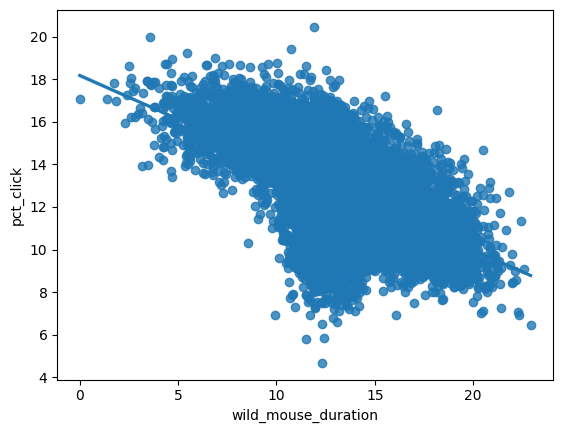

In [102]:
sns.regplot(data=sessionDataByDate.dropna(), x="wild_mouse_duration",y="pct_click") #-0.6

---
- We have found moderate positive correlation between the duration of rapid mouse movement and user doubleclicks
- The more the user moves the mouse rapidly the more doubleclicks they make

<Axes: xlabel='pct_doubleclick', ylabel='wild_mouse_duration'>

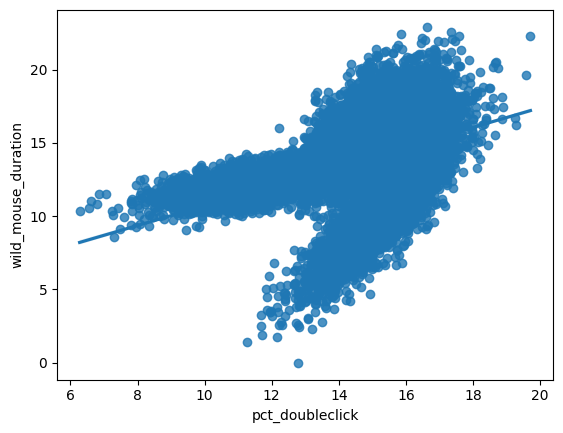

In [103]:
sns.regplot(data=sessionDataByDate.dropna(), x="pct_doubleclick",y="wild_mouse_duration") #0.41

---
- We have found weak negative correlation between the movement of the mouse (relative to the screen's size) and the amount of user clicks 
- The more the user moves the mouse the less clicks they make

<Axes: xlabel='mouse_move_total_rel_distance', ylabel='pct_click'>

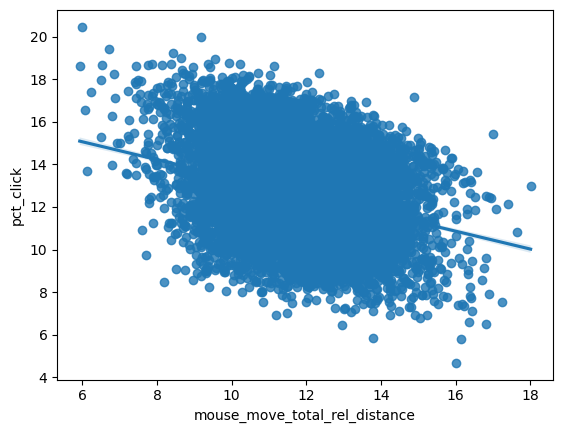

In [104]:
sns.regplot(data=sessionDataByDate.dropna(), x="mouse_move_total_rel_distance",y="pct_click") #-0.29

In [105]:
# sns.regplot(data=sessionDataByDate.dropna(), x="pct_scroll_move_duration",y="wild_mouse_duration") #-0.28
# sns.regplot(data=sessionDataByDate.dropna(), x="pct_scroll_move_duration",y="mouse_move_total_rel_distance") #0.22
# sns.regplot(data=sessionDataByDate.dropna(), x="wild_mouse_duration",y="pct_input") #0.28

### Correlation between attributes and the predicted variable (ack)

- We have found strong positive correlation between the scrolling (relative to the screen's size) and purchases made by users 
- The more the user scrolls the more likely they purchase something from the shop

<Axes: xlabel='scroll_move_total_rel_distance', ylabel='ack'>

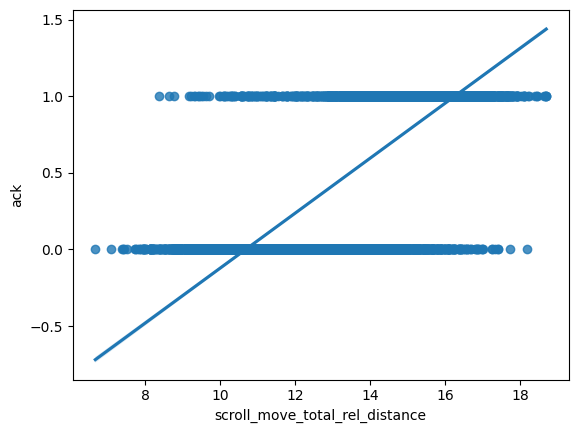

In [106]:
sns.regplot(data=sessionDataByDate.dropna(), x="scroll_move_total_rel_distance",y="ack") #0.74

---
- We have found moderate positive correlation between the time spent on the site and purchases made by users 
- The more time the user spends on the site the more likely they purchase something from the shop

<Axes: xlabel='page_activity_duration', ylabel='ack'>

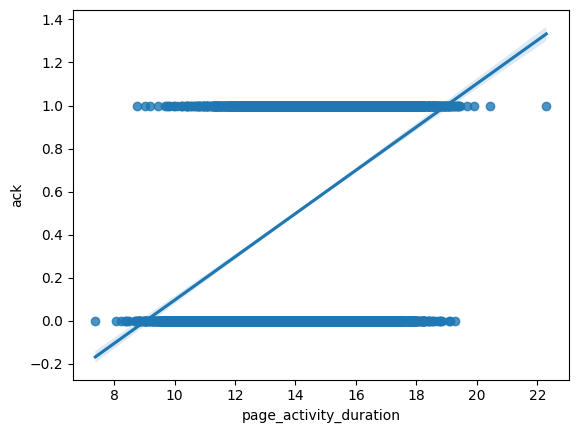

In [107]:
sns.regplot(data=sessionDataByDate.dropna(), x="page_activity_duration",y="ack") #0.39

### Attributes which influence the predicted variable (ack)
- amount of scrolling
- time spent on the site
- clicks made by the user

### Merging datasets
- Because user_id (user ; session) and product_ean (product ; session) are present across datasets we are able to combine them
- Merging these datasets is possible but not neccessary for now

# Hypothesis

### During the session, on average, scroll_move_total_rel_distance has a higher value when a purchase is made (ack=1) than when one isn't made (ack=0)

- We split the data to two groups.
- Group 1: people who purchased (ack=1)
- Group 2: people who did not purchase (ack=0)

In [308]:
purchased = sessionDataByDate.loc[sessionDataByDate.ack == 1, "scroll_move_total_rel_distance"]
not_purchased = sessionDataByDate.loc[sessionDataByDate.ack == 0, "scroll_move_total_rel_distance"]

- Removing outliers

In [309]:
purchased_out = identify_outliers(purchased)
not_purchased_out = identify_outliers(not_purchased)

In [310]:
purchased = purchased.drop(purchased_out.index)
not_purchased = not_purchased.drop(not_purchased_out.index)

- To verify normality, we use the Shapiro-Wilk test, which tests if the data comes from a normal distribution.
- If the p-value < 0.05, we reject the null hypothesis and the data probably come from a non-normal distribution.
- If the p-value > 0.05 then we fail to reject the null hypotesis, thus the data comes from a normal distribution.

In [311]:
np.random.seed(100)
data = np.random.choice(purchased, size=len(not_purchased))

In [315]:
stats.shapiro(data)

ShapiroResult(statistic=0.9983388185501099, pvalue=4.6930304961279035e-05)

In [316]:
stats.shapiro(not_purchased)

ShapiroResult(statistic=0.9959619641304016, pvalue=2.254351705310853e-10)

- Because the data comes from a non-normal distribution we need to use a non-parametric test.
- We will use Mann-Whitney U test
- If the p-value < 0.001 we reject the hypothesis and accept the alternative one.
- If the p-value > 0.001 we accept the null hypothesis.

In [293]:
stats.mannwhitneyu(data, not_purchased)

MannwhitneyuResult(statistic=23123016.5, pvalue=0.0)

### At this significance level, there is not enough evidence to say that people who make purchases scroll more on average
---

### During the session, on average, page_activity_duration has a higher value when a purchase is made (ack=1) than when one isn't made (ack=0)

- We split the data to two groups.
- Group 1: people who purchased (ack=1)
- Group 2: people who did not purchase (ack=0)

In [324]:
purchased = sessionDataByDate.loc[sessionDataByDate.ack == 1, "page_activity_duration"]
not_purchased = sessionDataByDate.loc[sessionDataByDate.ack == 0, "page_activity_duration"]

- Removing outliers

In [325]:
purchased_out = identify_outliers(purchased)

In [326]:
purchased = purchased.drop(purchased_out.index)

- To verify normality, we use the Shapiro-Wilk test, which tests if the data comes from a normal distribution.
- If the p-value < 0.05, we reject the null hypothesis and the data probably come from a non-normal distribution.
- If the p-value > 0.05 then we fail to reject the null hypotesis, thus the data comes from a normal distribution.

In [327]:
np.random.seed(100)
data = np.random.choice(purchased, size=len(not_purchased))

In [328]:
stats.shapiro(data)

ShapiroResult(statistic=0.998307466506958, pvalue=3.512743933242746e-05)

In [329]:
stats.shapiro(not_purchased)

ShapiroResult(statistic=0.9815049171447754, pvalue=6.031935178844498e-25)

- Because the data comes from a non-normal distribution we need to use a non-parametric test.
- We will use Mann-Whitney U test
- If the p-value < 0.001 we reject the hypothesis and accept the alternative one.
- If the p-value > 0.001 we accept the null hypothesis.

In [330]:
stats.mannwhitneyu(data,not_purchased)

MannwhitneyuResult(statistic=17549544.0, pvalue=5.5293485211522595e-298)

### At this significance level, there is not enough evidence to say that people who make purchases spend more time on the page on average